Published on July 17, 2023. By Marília Prata, mpwolke

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objs as go
import itertools

from IPython.display import Markdown, display
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
from wordcloud import WordCloud
import re

import warnings
warnings.simplefilter(action='ignore', category=Warning)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


@article{rakib2023oodspeech,

title={{OOD-Speech: A Large Bengali Speech Recognition Dataset for Out-of-Distribution Benchmarking},

author={Rakib, Fazle Rabbi and Dip, Souhardya Saha and Alam, Samiul and Tasnim, Nazia and Shihab, Md Istiak Hossain and Ansary, Md Nazmuddoha and Hossen, Syed Mobassir and Meghla, Marsia Haque and Mamun, Mamunur and Sadeque, Farig and others},

journal={Proc. Interspeech 2023},

year={2023} }

![](https://youngbutterfly.in/wp-content/uploads/2021/07/Learn-and-Speak-Bengali-Language.png)youngbutterfly

#Bengali Language - Bangla

"Bengali generally known by its endonym Bangla, is an Indo-Aryan language native to the Bengal region of South Asia. With approximately 235 million native speakers and another 40 million as second language speakers, Bengali is the sixth most spoken native language and the seventh most spoken language by the total number of speakers in the world. Bengali is the fifth most spoken Indo-European language."

https://en.wikipedia.org/wiki/Bengali_language

In [2]:
train = pd.read_csv("../input/bengaliai-speech/train.csv")
train.head()
#test = pd.read_csv("../input/chaii-hindi-and-tamil-question-answering/test.csv")
#sample = pd.read_csv("../input/chaii-hindi-and-tamil-question-answering/sample_submission.csv")

,id,sentence,split
0,000005f3362c,ও বলেছে আপনার ঠিকানা!,train
1,00001dddd002,কোন মহান রাষ্ট্রের নাগরিক হতে চাও?,train
2,00001e0bc131,"আমি তোমার কষ্টটা বুঝছি, কিন্তু এটা সঠিক পথ না।",train
3,000024b3d810,নাচ শেষ হওয়ার পর সকলে শরীর ধুয়ে একসঙ্গে ভোজন...,train
4,000028220ab3,"হুমম, ওহ হেই, দেখো।",train


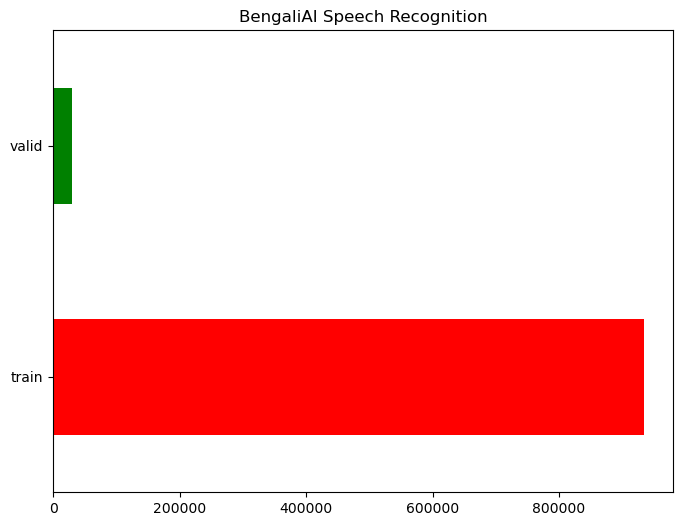

In [139]:
#Code by Lucas Abrahão https://www.kaggle.com/lucasabrahao/trabalho-manufatura-an-lise-de-dados-no-brasil

train["split"].value_counts().plot.barh(figsize = (8,6),color=['red', 'green'], title='BengaliAI Speech Recognition');

In [4]:
sample = pd.read_csv("../input/bengaliai-speech/sample_submission.csv")
sample.head()

,id,sentence
0,0f3dac00655e,এছাড়াও নিউজিল্যান্ড এ ক্রিকেট দলের হয়েও খেলছ...
1,a9395e01ad21,এছাড়াও নিউজিল্যান্ড এ ক্রিকেট দলের হয়েও খেলছ...
2,bf36ea8b718d,এছাড়াও নিউজিল্যান্ড এ ক্রিকেট দলের হয়েও খেলছ...


#OOD-Speech (Out-of Distribution Speech)

OOD-Speech: A Large Bengali Speech Recognition Dataset for Out-of-Distribution Benchmarking

Authors: Fazle Rabbi Rakib, Souhardya Saha Dip, Samiul Alam, Nazia Tasnim, Md. Istiak Hossain Shihab, Md. Nazmuddoha Ansary, Syed Mobassir Hossen, Marsia Haque Meghla, Mamunur Mamun, Farig Sadeque, Sayma Sultana Chowdhury, Tahsin Reasat, Asif Sushmit, Ahmed Imtiaz Humayun

"The authors presented OOD-Speech, the first out-of-distribution (OOD) benchmarking dataset for Bengali automatic speech recognition (ASR). Being one of the most spoken languages globally, Bengali portrays large diversity in dialects and prosodic features, which demands ASR frameworks to be robust towards distribution shifts."

"For example, islamic religious sermons in Bengali are delivered with a tonality that is significantly different from regular speech. Their training dataset is collected via massively online crowdsourcing campaigns which resulted in 1177.94 hours collected and curated from 22,645 native Bengali speakers from South Asia."

"Their test dataset comprises 23.03 hours of speech collected and manually annotated from 17 different sources, e.g., Bengali TV drama, Audiobook, Talk show, Online class, and Islamic sermons to name a few. OOD-Speech is jointly the largest publicly available speech dataset, as well as the first out-of-distribution ASR benchmarking dataset for Bengali."

https://arxiv.org/abs/2305.09688 arXiv:2305.09688

In [5]:
%%capture
!pip install langdetect # Language Detection
!pip install bnlp_toolkit # For Bangla Word Cloud
!wget https://www.omicronlab.com/download/fonts/kalpurush.ttf # Bangla Font For the Word Cloud

In [6]:
def printmd(string):
  display(Markdown(string))

from langdetect import detect
import unicodedata
import html

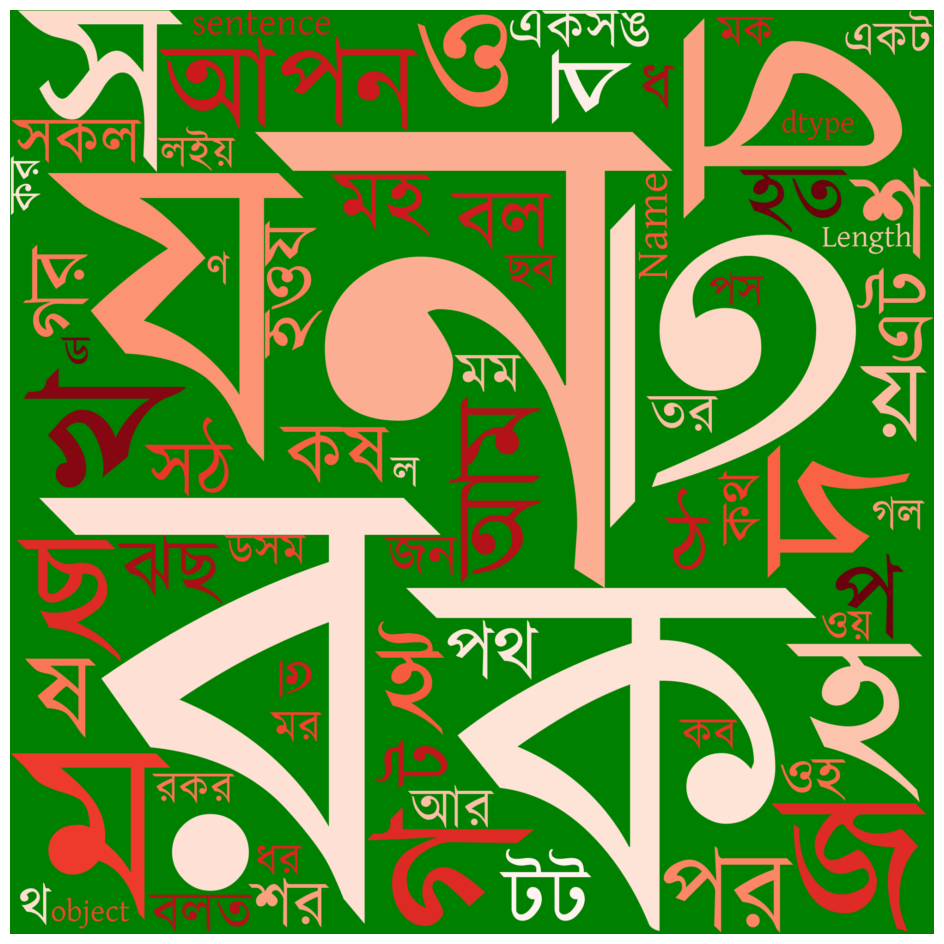

BengaliAI Sentences

In [9]:
#Code by Tanjima Nasreen Jenia  https://www.kaggle.com/tanjimanasreenjenia/bangladeshi-restaurants-analytics/notebook

from bnlp.corpus import stopwords, punctuations
regex = r"[\u0980-\u09FF]+" 
data = train

wc = WordCloud(background_color = 'green',
                      height =2000,
                      width = 2000,
                      colormap = "Reds",
                      font_path="./kalpurush.ttf"
                     ).generate(str(train["sentence"]))                                                                                                                        

plt.rcParams['figure.figsize'] = (12,12)
plt.imshow(wc, interpolation="bilinear")
plt.axis('off')
plt.show()
result = wc.to_file("Bangla_word_cloud.png")
printmd("BengaliAI Sentences")

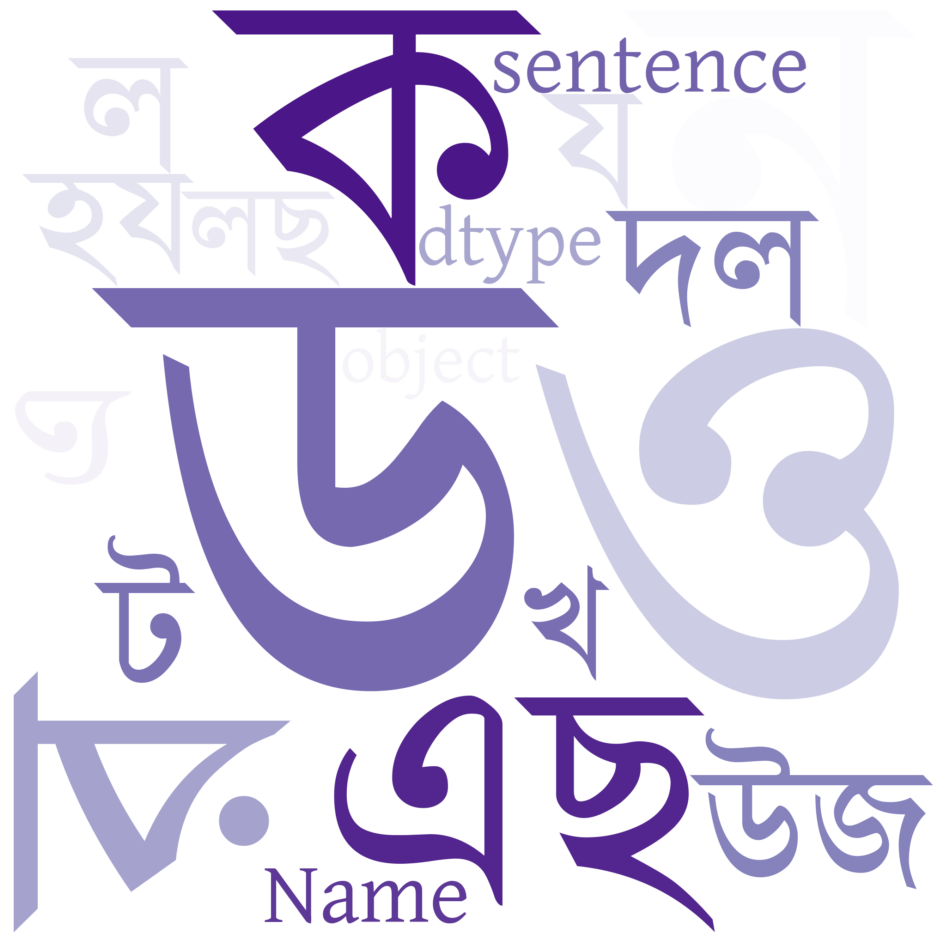

Bengali Speech

In [10]:
#Code by Tanjima Nasreen Jenia  https://www.kaggle.com/tanjimanasreenjenia/bangladeshi-restaurants-analytics/notebook

from bnlp.corpus import stopwords, punctuations
regex = r"[\u0980-\u09FF]+" 
data = sample

wc = WordCloud(background_color = 'white',               
                      height =2000,
                      width = 2000,               
                      font_path="./kalpurush.ttf",
                      colormap ='Purples'
                     ).generate(str(sample["sentence"]))                                                                                                                        

plt.rcParams['figure.figsize'] = (12,12)
plt.imshow(wc, interpolation="bilinear")
plt.axis('off')
plt.show()
result = wc.to_file("Bangla_word_cloud.png")
printmd("Bengali Speech")

In [15]:
! pip install pydub

#Slang Profanity (mp3) I choose 2 because it's not in order

In [22]:
bengali = []
cwd = '/kaggle/input/bengaliai-speech/examples/'

for dirname, _, filenames in os.walk('/kaggle/input/bengaliai-speech/examples/'):
    for filename in filenames:
        #print(os.path.join(dirname, filename))
        bengali.append(filename)
#data = pd.read_csv('/kaggle/input/us-election-2020-presidential-debates/us_election_2020_1st_presidential_debate.csv')
bengali.pop(2)#Original is 0 zero though the 1st mp3 is on the 13th line They are Not in order here.
#I chose Slang Profanity manualy 

'Slang Profanity.mp3'

In [79]:
from pydub import AudioSegment
import IPython

# We will listen to this file:
# 213_1p5_Pr_mc_AKGC417L.wav
file = '/kaggle/input/bengaliai-speech/Stage Drama Jatra.wav'
print(cwd+bengali[13])#Original is zero
IPython.display.Audio(cwd+bengali[13])#Original is 2

/kaggle/input/bengaliai-speech/examples/Stage Drama Jatra.wav


In [56]:
# https://www.kaggle.com/rakibilly/extract-audio-starter
import subprocess
import glob
import os
from pathlib import Path
import shutil
from zipfile import ZipFile

#Added ffmpeg Static build though it didn't help me in any step.

In [85]:
! tar xvf ../input/ffmpeg-static-build/ffmpeg-git-amd64-static.tar.xz

ffmpeg-git-20191209-amd64-static/
ffmpeg-git-20191209-amd64-static/GPLv3.txt
ffmpeg-git-20191209-amd64-static/manpages/
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-all.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-scaler.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-resampler.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-filters.txt
ffmpeg-git-20191209-amd64-static/manpages/ffprobe.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-devices.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-utils.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-protocols.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-codecs.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-bitstream-filters.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg.txt
ffmpeg-git-20191209-amd64-static/manpages/ffmpeg-formats.txt
ffmpeg-git-20191209-amd64-static/ffprobe
ffmpeg-git-20191209-amd64-static/qt-faststart
ffmpeg-git-20191209-amd64-static/model/
ffmpeg-git-20191209-amd64-stat

In [86]:
# Convert MP3s to WAV for easy conversion to numpy arrays:
output_format = 'wav'  # can also use aac, wav, etc
output_dir = Path(f"{output_format}s")
Path(output_dir).mkdir(exist_ok=True, parents=True)

#Only do first 50 because notebook memory limitations...
for song in songs[:50]:
    file = cwd+song
    file_name = song.replace(".mp3","")
    command = f"../working/ffmpeg-git-20191209-amd64-static/ffmpeg -i {file} -ab 192000 -ac 2 -ar 44100 -vn {output_dir/file_name}.{output_format}"
    subprocess.call(command, shell=True)

In [87]:
from scipy.io.wavfile import read, write
#a = read("adios.wav")
wavs = []
np_arrays = []
for dirname, _, filenames in os.walk('/kaggle/working/wavs/'):
    for filename in filenames:
        wav_file = dirname+filename
        #print(wav_file)
        wavs.append(wav_file)
        try:
            fs, io_file = read(wav_file)
        except ValueError:
            continue
        data = np.array(io_file,dtype=float)
        wav_info= {
            'name': filename,
            'fs' : fs,
            'left': data[:,0],
            'right': data[:,1]
        }
        
        np_arrays.append(wav_info)

print("Succesfully converted: "+str(len(np_arrays)))

Succesfully converted: 0


#There were only 2 MP3 files the others were already wav files, so ZERO converted above 

In [91]:
# Other  
import librosa
import librosa.display
import json
import tensorflow as tf
from matplotlib.pyplot import specgram
import glob 
import os
from tqdm import tqdm
import pickle
import IPython.display as ipd  # To play sound in the notebook

#Poem Recital

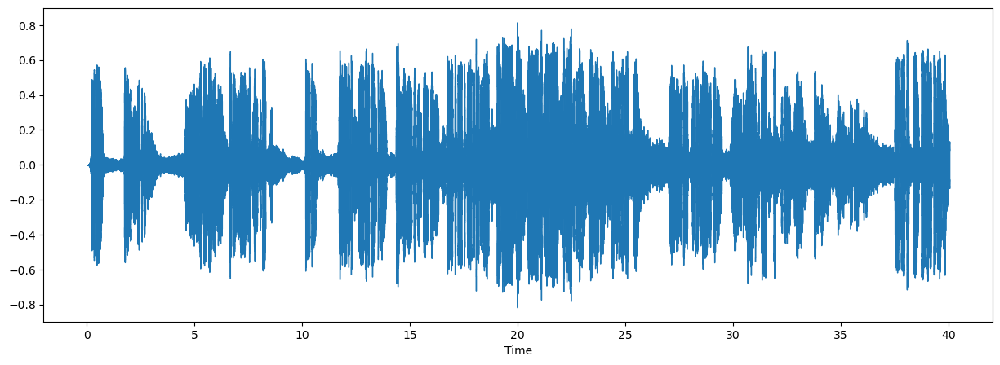

In [94]:
#By Eu Jin Lok https://www.kaggle.com/ejlok1/audio-emotion-part-5-data-augmentation/notebook

# Use one audio file in previous parts again
fname = '/kaggle/input/bengaliai-speech/examples/Poem Recital.wav'  
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
librosa.display.waveshow(data, sr=sampling_rate)#librosa.display' has no attribute 'waveplot'

# Paly it again to refresh our memory
ipd.Audio(data, rate=sampling_rate)

In [96]:
general_path = '../input/bengaliai-speech/examples'

In [97]:
#By Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Importing 1 file
y, sr = librosa.load(f'{general_path}/Poem Recital.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 661794/22050)

y: [ 0.          0.          0.         ...  0.01337987 -0.02283673
 -0.03372705] 

y shape: (883032,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


In [98]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [ 5.8207661e-11 -5.8207661e-11  0.0000000e+00 ...  1.3379874e-02
 -2.2836728e-02 -3.3727050e-02] 

Audio File shape: (882008,)


#2D Representation: Sound Waves

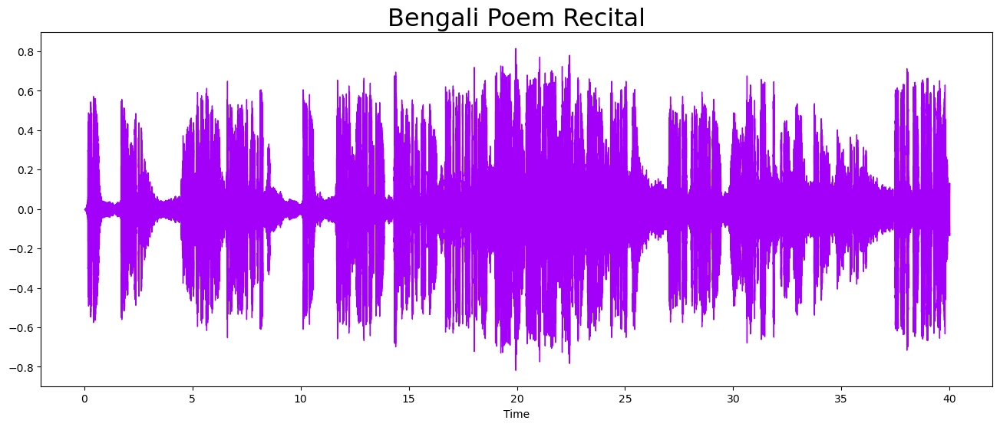

In [100]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

plt.figure(figsize = (16, 6))
librosa.display.waveshow(y = audio_file, sr = sr, color = "#A300F9");#Waveplot is waveshow
plt.title("Bengali Poem Recital", fontsize = 23);

#Fourier Transform

"Function that gets a signal in the time domain as input, and outputs its decomposition into frequencies
Transform both the y-axis (frequency) to log scale, and the “color” axis (amplitude) to Decibels, which is approx. the log scale of amplitudes."

In [101]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object:', np.shape(D))

Shape of D object: (1025, 1723)


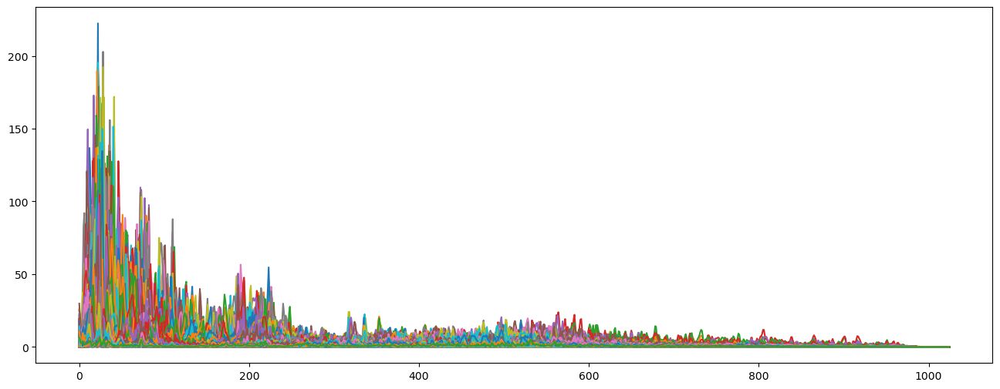

In [102]:
plt.figure(figsize = (16, 6))
plt.plot(D);

#Spectrogram

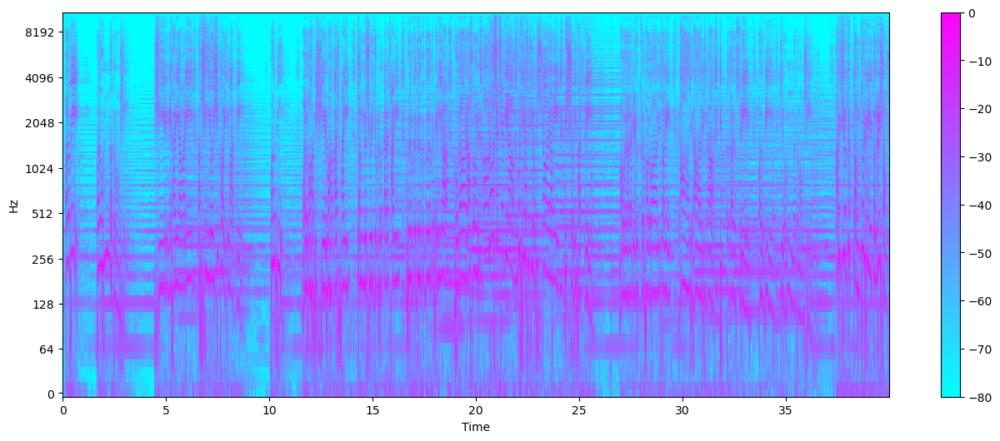

In [103]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB = librosa.amplitude_to_db(D, ref = np.max)

# Creating the Spectogram
plt.figure(figsize = (16, 6))
librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool')
plt.colorbar();

In [122]:
!pip install librosa==0.9.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.3/214.3 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 82.6 MB/s eta 0:00:00:00:01
  Attempting uninstall: librosa
    Found existing installation: librosa 0.10.0.post2
    Uninstalling librosa-0.10.0.post2:
      Successfully uninstalled librosa-0.10.0.post2


#Mel Spectrogram 

"The Mel Scale, mathematically speaking, is the result of some non-linear transformation of the frequency scale. The Mel Spectrogram is a normal Spectrogram, but with a Mel Scale on the y axis."

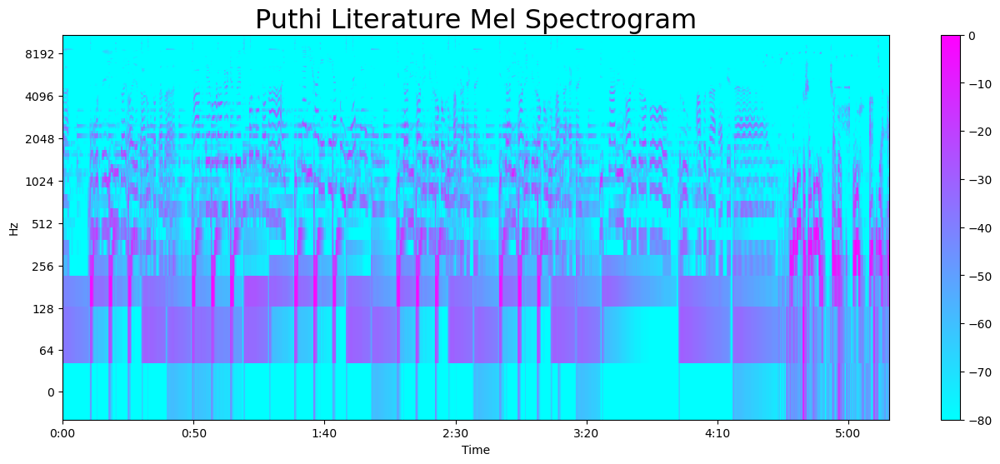

In [137]:
#https://librosa.org/doc/main/generated/librosa.feature.melspectrogram.html

y, sr = librosa.load(f'{general_path}/Puthi Literature.wav')
y, _ = librosa.effects.trim(y)


S = librosa.feature.melspectrogram(y=y, sr=sr)#y=y fixed passes 0 argument error
S_DB = librosa.amplitude_to_db(S, ref=np.max)
plt.figure(figsize = (16, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool');
plt.colorbar();
plt.title("Puthi Literature Mel Spectrogram", fontsize = 23);

#Classical Mel Spectrogram

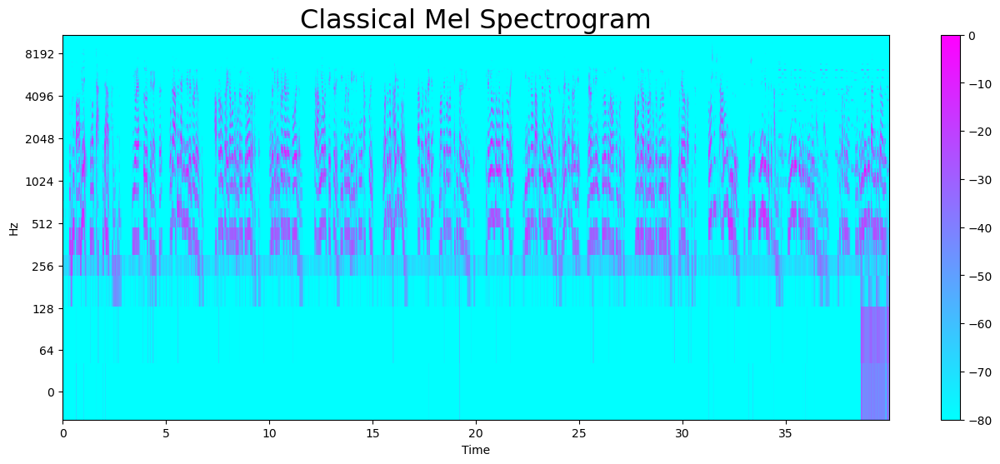

In [125]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

y, sr = librosa.load(f'{general_path}/Bangladeshi TV Drama.wav')
y, _ = librosa.effects.trim(y)


S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)
plt.figure(figsize = (16, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool');
plt.colorbar();
plt.title("Classical Mel Spectrogram", fontsize = 23);

#Audio Features

Zero Crossing Rate: the rate at which the signal changes from positive to negative or back.

In [109]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Total zero_crossings in our 1 song
zero_crossings = librosa.zero_crossings(audio_file, pad=False)
print(sum(zero_crossings))

67495


#Harmonics and Perceptrual

"Harmonics are characteristichs that human years can't distinguish (represents the sound color)
Perceptrual understanding shock wave represents the sound rhythm and emotion"

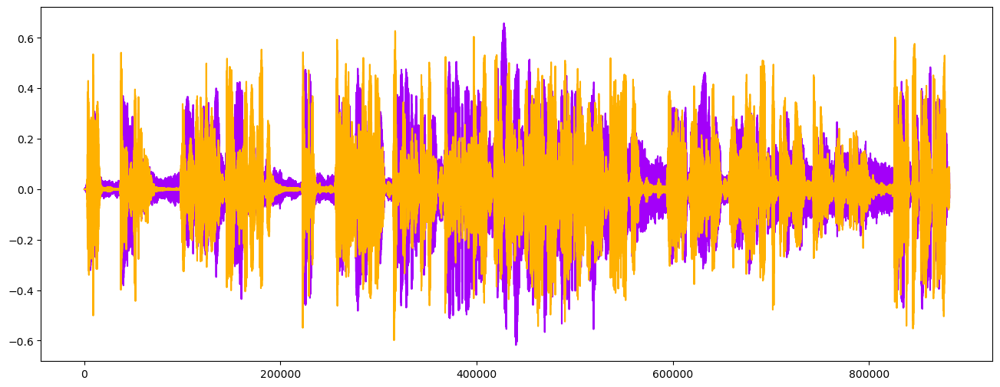

In [110]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

y_harm, y_perc = librosa.effects.hpss(audio_file)

plt.figure(figsize = (16, 6))
plt.plot(y_harm, color = '#A300F9');
plt.plot(y_perc, color = '#FFB100');

#Tempo BMP (beats per minute)

Dynamic programming beat tracker.

In [126]:
tempo, _ = librosa.beat.beat_track(y=y, sr = sr)
tempo

117.45383522727273

#Spectral Centroid

"Indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound."

In [129]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Calculate the Spectral Centroids
spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]#Changed audio_file to y=y

# Shape is a vector
print('Centroids:', spectral_centroids, '\n')
print('Shape of Spectral Centroids:', spectral_centroids.shape, '\n')

# Computing the time variable for visualization
frames = range(len(spectral_centroids))

# Converts frame counts to time (seconds)
t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

# Function that normalizes the Sound Data
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Centroids: [1893.23397753 1765.4197737  1681.40219717 ... 1271.36241042 1242.42281003
 1420.05273951] 

Shape of Spectral Centroids: (1723,) 

frames: range(0, 1723) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 3.99383220e+01
 3.99615420e+01 3.99847619e+01]


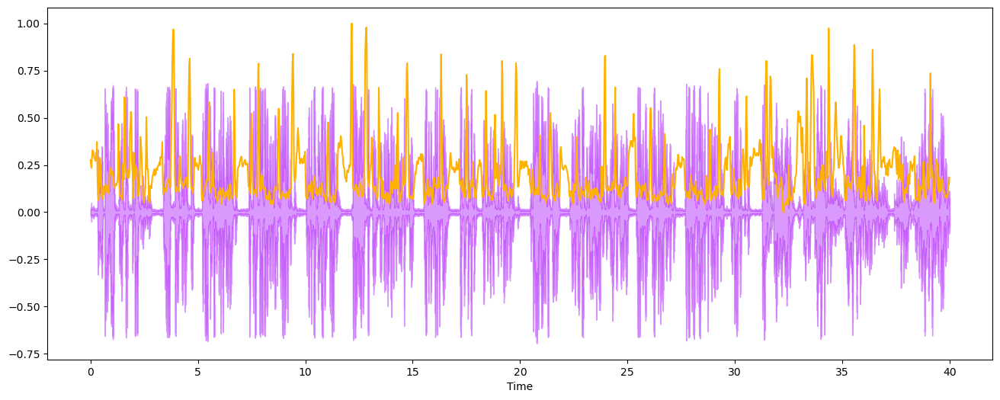

In [130]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

#Plotting the Spectral Centroid along the waveform
plt.figure(figsize = (16, 6))
librosa.display.waveshow(y=y, sr=sr, alpha=0.4, color = '#A300F9');
plt.plot(t, normalize(spectral_centroids), color='#FFB100');

#Spectral Rolloff

"It's a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies"

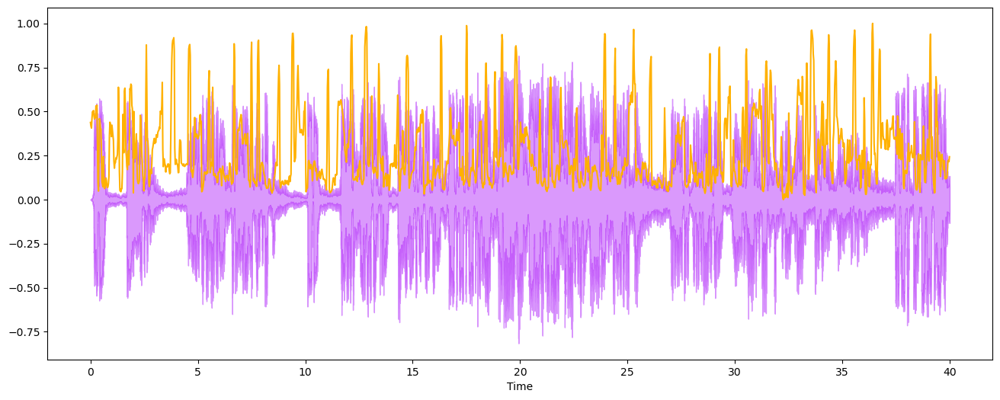

In [131]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Spectral RollOff Vector
spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]

# The plot
plt.figure(figsize = (16, 6))
librosa.display.waveshow(audio_file, sr=sr, alpha=0.4, color = '#A300F9');
plt.plot(t, normalize(spectral_rolloff), color='#FFB100');

#Mel-Frequency Cepstral Coefficients:

The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.

mfccs shape: (20, 1723)


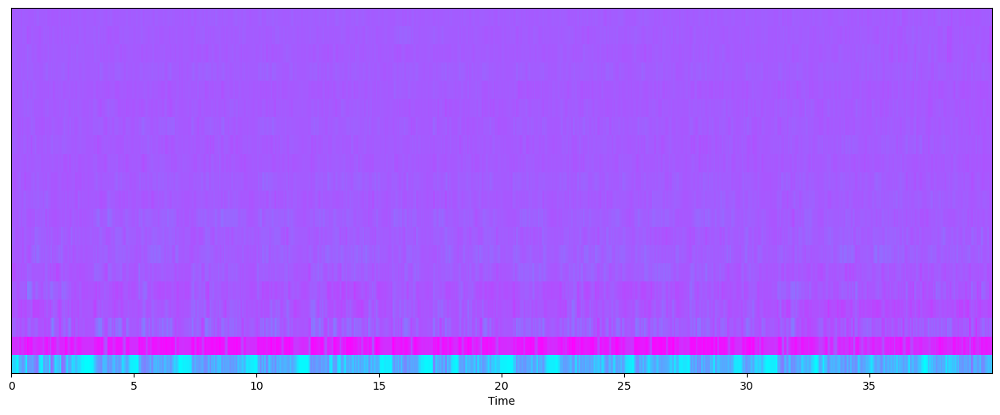

In [132]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

import sklearn
mfccs = librosa.feature.mfcc(y=y, sr=sr)
print('mfccs shape:', mfccs.shape)

#Displaying  the MFCCs:
plt.figure(figsize = (16, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap = 'cool');

#Scaling

Mean: 6.641957e-10 

Var: 1.0000001


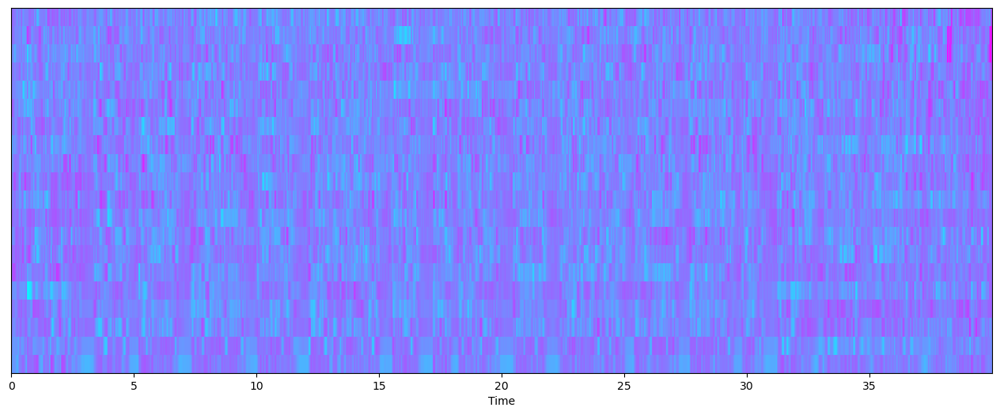

In [134]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Perform Feature Scaling
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print('Mean:', mfccs.mean(), '\n')
print('Var:', mfccs.var())

plt.figure(figsize = (16, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap = 'cool');

#Chroma Frequencies

"Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave."

Chromogram shape: (12, 177)


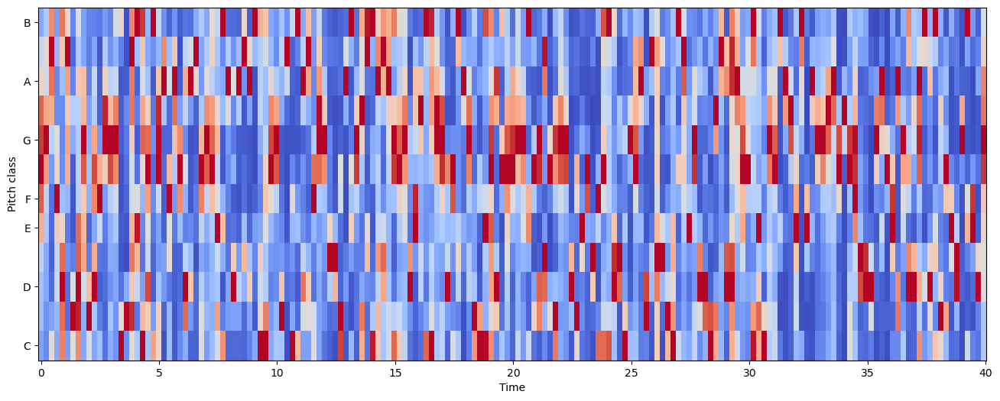

In [136]:
#Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

# Increase or decrease hop_length to change how granular you want your data to be
hop_length = 5000

# Chromogram
chromagram = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length)#y=y fix error
print('Chromogram shape:', chromagram.shape)

plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm');

#I didn't learn Bangla but I learned that y=y

To avoid many Errors "takes 0 positional arguments but 1 were given". I had to add y=y (original was just y). Example: (y=y, sr=sr) 

#Acknowledgements:

Andrada Olteanu https://www.kaggle.com/code/andradaolteanu/work-w-audio-data-visualise-classify-recommend

Tanjima Nasreen Jenia  https://www.kaggle.com/tanjimanasreenjenia/bangladeshi-restaurants-analytics/notebook

Eu Jin Lok https://www.kaggle.com/ejlok1/audio-emotion-part-5-data-augmentation/notebook

Lucas Abrahão https://www.kaggle.com/lucasabrahao/trabalho-manufatura-an-lise-de-dados-no-brasil